# Import module

In [4]:
import numpy as np
import pandas as pd 
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import sctk

In [10]:
sc.settings.set_figure_params(dpi=300)

# Read in data

In [6]:
adata = sc.read_h5ad('/nfs/team205/heart/anndata_objects/8regions/ArchR/project_output/PeakMatrix/Adult_Peaks_post-peakVI.h5ad')
adata

AnnData object with n_obs × n_vars = 139835 × 429828
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'batch_key', 'cell_type', 'cell_state', '_scvi_batch', '_scvi_labels'
    uns: '_scvi_manager_uuid', '_scvi_uuid'
    obsm: 'X_PeakVI'

In [7]:
adata.obs['cell_type']=adata.obs['cell_type'].astype('category')
adata.obs['cell_type'].cat.reorder_categories([
   'Atrial Cardiomyocyte', 
    'Ventricular Cardiomyocyte',
    'Fibroblast',
    'Endothelial cell', 
    'Lymphatic Endothelial cell',
    'Mural cell',
    'Mesothelial cell',
     'Neural cell',
    'Adipocyte', 
    'Myeloid',
        'Lymphoid', 
    'Mast cell',
     ], inplace=True)

adata.obs['cell_state']=adata.obs['cell_state'].astype('category')
cell_state_order = [
    'SAN_P_cell','AVN_P_cell','AVN_bundle_cell','Purkinje_cell',
    'aCM1','aCM2', 'aCM3', 'aCM4', 'aCM5', 
    'vCM1', 'vCM2','vCM3_stressed', 'vCM4', 'vCM5', 
     'EC1_cap','EC2_cap', 'EC3_cap', 'EC4_immune', 'EC5_art', 'EC6_ven','EC7_endocardial',
       'EC8_ln', 'EC9_FB-like', 'EC10_CMC-like', 
    'PC1_vent', 'PC2_atria', 'PC3_str', 'PC4_CMC-like', 'SMC1_basic', 'SMC2_art',
    'FB1', 'FB2', 'FB3', 'FB4_activated','FB5', 'FB6',
    'Meso',
    'Adip1', 'Adip2', 'Adip3', 'Adip4',
   'NC1_glial','NC2_glial_NGF+', 'NC3_glial', 'NC4_glial', 'NC5_glial','NC6_schwann',
    'CD4+T_naive', 'CD4+T_act','CD4+T_Th1', 'CD4+T_Th2', 'CD4+T_Th17', 'CD4+T_Tfh',
       'CD4+T_reg', 'CD8+T_cytox', 'CD8+T_em', 'CD8+T_te', 'CD8+T_trans','MAIT-like','gdT', 
    'NK_CD16hi', 'NK_CD56hi', 'ILC', 
     'B', 'B_plasma', 
    'CD14+Mo',  'CD16+Mo', 'MoMP',
    'LYVE1+IGF1+MP','LYVE1+TIMD4+MP', 'LYVE1+MP_cycling','DC','Neut','Mast',
    'T/NK_cycling'
     ]
cell_state_order = [x for x in cell_state_order if x in list(set(adata.obs.cell_state))]
adata.obs['cell_state'].cat.reorder_categories(cell_state_order, inplace=True)

# Find neighbors, UMAP/Clustering

In [8]:
%%time
# compute the k-nearest-neighbor graph that is used in both clustering and umap algorithms
sc.pp.neighbors(adata, use_rep="X_PeakVI")
# compute the umap
sc.tl.umap(adata, min_dist=0.2)
# cluster the space (we use a lower resolution to get fewer clusters than the default)
sc.tl.leiden(adata, key_added="cluster_pvi", resolution=1)

CPU times: user 10min 10s, sys: 6min 12s, total: 16min 23s
Wall time: 5min 2s


# Visualise

In [ ]:
# rename cell_states
'''
adata.obs.replace({'cell_state':{
    'FB4':'FB4_activated',
    'vCM3':'vCM3_stressed',
    'NC1':'NC1_glial',
    'NC2':'NC2_glial_NGF+',
    'NC3':'NC3_glial',
    'NC4':'NC4_glial',
    'NC5':'NC5_glial',
    'NC6':'NC6_schwann',
    'EC7_atria':'EC7_endocardial',
}},inplace=True)
'''

# reorder cell_states
adata.obs['cell_state']=adata.obs['cell_state'].astype('category')
adata.obs['cell_state'].cat.reorder_categories([
    'SAN_P_cell','AVN_P_cell','AVN_bundle_cell',
    'aCM1','aCM2', 'aCM3', 'aCM4', 
    'vCM1', 'vCM2','vCM3_stressed', 'vCM4', 
     'EC1_cap','EC2_cap', 'EC3_cap', 'EC4_immune', 'EC5_art', 'EC6_ven','EC7_endocardial',
       'EC8_ln',  'EC10_CMC-like', 
    'PC1_vent', 'PC2_atria', 'PC3_str', 'PC4_CMC-like', 'SMC1_basic', 'SMC2_art',
    'FB1', 'FB2', 'FB3', 'FB4_activated','FB5', 'FB6',
    'Meso',
    'Adip1', 'Adip2',
   'NC1_glial','NC2_glial_NGF+', 
    'CD4+T_naive', 'CD4+T_act',
    'CD8+T_cytox', 'CD8+T_em', 'CD8+T_te', 'CD8+T_trans','MAIT-like',
    'NK_CD16hi', 'NK_CD56hi',
     'B', 'B_plasma', 
    'CD14+Mo',  'CD16+Mo', 'MoMP',
    'LYVE1+IGF1+MP','LYVE1+TIMD4+MP', 'LYVE1+MP_cycling','DC','Mast',
     ], inplace=True)

adata

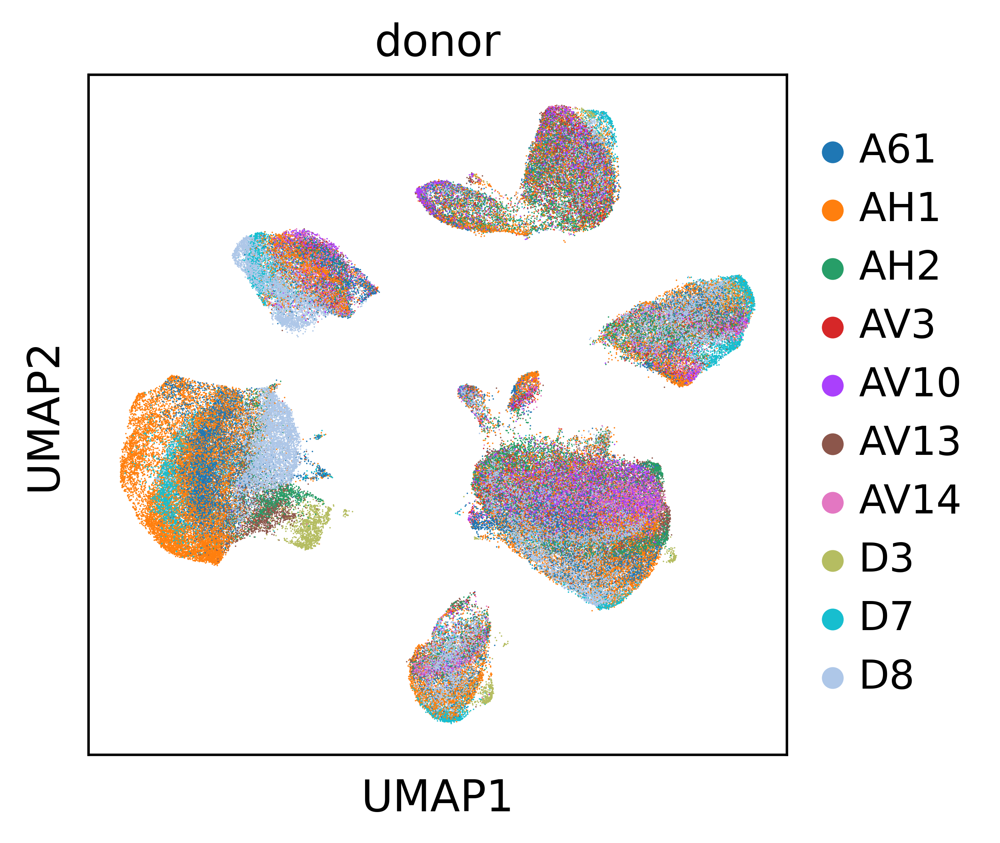

In [11]:
sc.pl.umap(adata, color=['donor'], ncols=3, wspace=0.4)

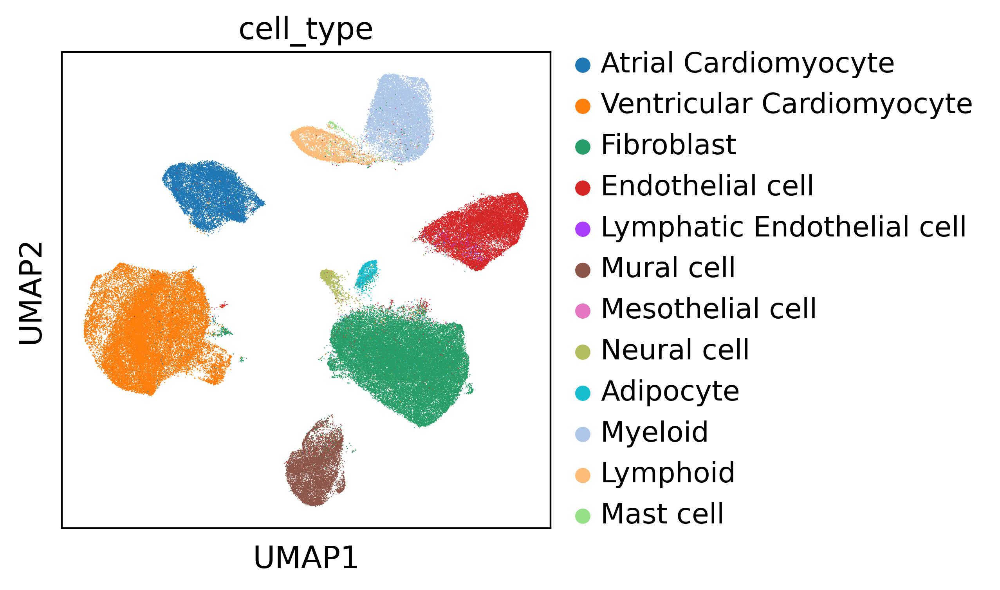

In [13]:
sc.pl.umap(adata, color=['cell_type'], ncols=3, wspace=0.4)

# UMAP with cell states

In [3]:
adata_rna = sc.read_h5ad('/nfs/team205/heart/anndata_objects/8regions/RNA_adult-8reg_full_raw_cellstate-annotated.h5ad',
                    backed = 'r')
adata_rna

AnnData object with n_obs × n_vars = 704296 × 32732 backed at '/nfs/team205/heart/anndata_objects/8regions/RNA_adult-8reg_full_raw_cellstate-annotated.h5ad'
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', 'cell_state', 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_counts', '_scvi_batch', '_scvi_labels', 'clus20', 'doublet_cls', 'original_or_new', 'batch', 'scANVI_predictions', 'leiden_scArches'
    var: 'gene_name-new', 'gene_name_scRNA-0-original', 'gene_name_snRNA-1-original', 'gene_name_multiome-2-original'
    uns:

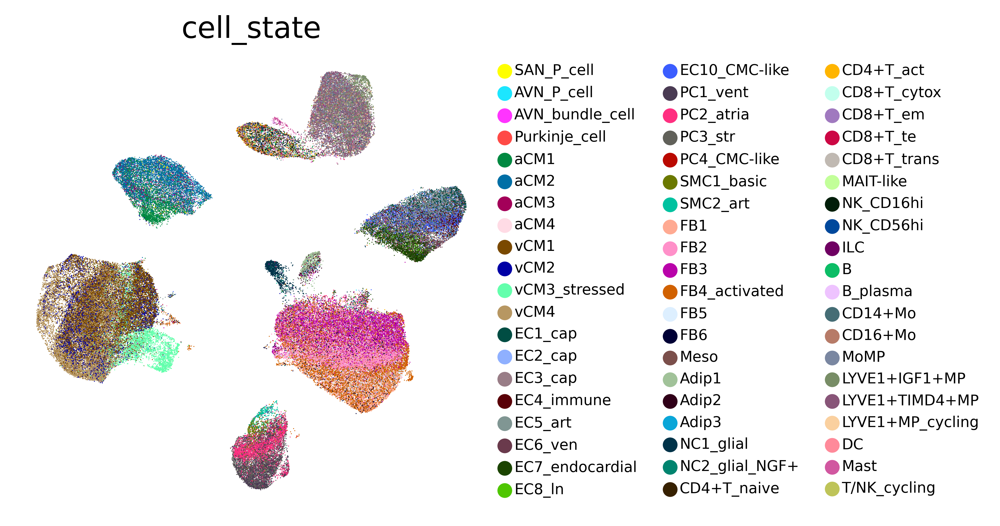

In [13]:
sc.pl.umap(adata, color=['cell_state'], legend_fontsize=7, frameon=False, )

In [4]:
adata_rna.obs['cell_state'].cat.categories

Index(['SAN_P_cell', 'AVN_P_cell', 'AVN_bundle_cell', 'Purkinje_cell', 'aCM1',
       'aCM2', 'aCM3', 'aCM4', 'aCM5', 'vCM1', 'vCM2', 'vCM3_stressed', 'vCM4',
       'vCM5', 'EC1_cap', 'EC2_cap', 'EC3_cap', 'EC4_immune', 'EC5_art',
       'EC6_ven', 'EC7_endocardial', 'EC8_ln', 'EC9_FB-like', 'EC10_CMC-like',
       'PC1_vent', 'PC2_atria', 'PC3_str', 'PC4_CMC-like', 'SMC1_basic',
       'SMC2_art', 'FB1', 'FB2', 'FB3', 'FB4_activated', 'FB5', 'FB6', 'Meso',
       'Adip1', 'Adip2', 'Adip3', 'Adip4', 'NC1_glial', 'NC2_glial_NGF+',
       'NC3_glial', 'NC4_glial', 'NC5_glial', 'NC6_schwann', 'CD4+T_naive',
       'CD4+T_act', 'CD4+T_Th1', 'CD4+T_Th2', 'CD4+T_Th17', 'CD4+T_Tfh',
       'CD4+T_reg', 'CD8+T_cytox', 'CD8+T_em', 'CD8+T_te', 'CD8+T_trans',
       'MAIT-like', 'gdT', 'NK_CD16hi', 'NK_CD56hi', 'ILC', 'B', 'B_plasma',
       'CD14+Mo', 'CD16+Mo', 'MoMP', 'LYVE1+IGF1+MP', 'LYVE1+TIMD4+MP',
       'LYVE1+MP_cycling', 'DC', 'Neut', 'Mast', 'T/NK_cycling',
       'unclassified'],
  

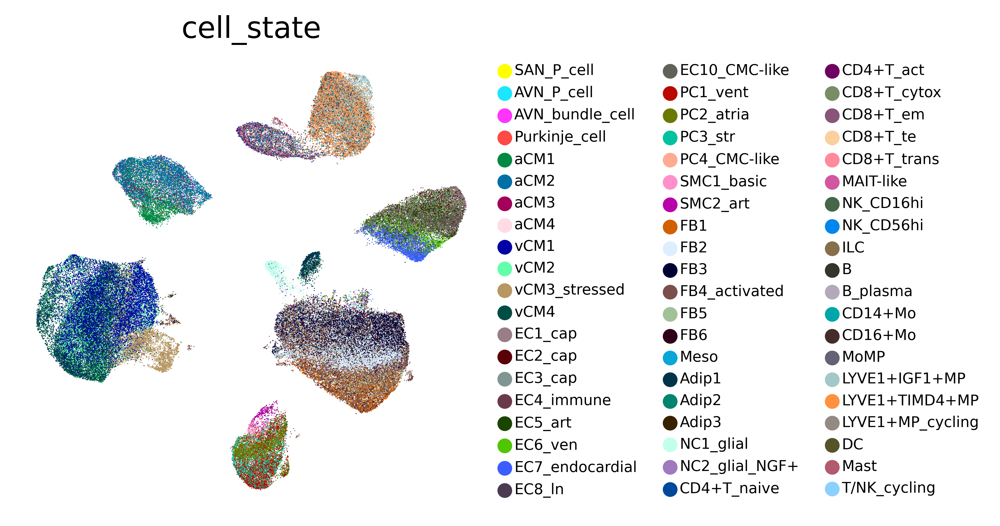

In [28]:
rna_cellstates = list(adata_rna.obs['cell_state'].cat.categories)
atac_cellstates = list(adata.obs['cell_state'].cat.categories)
cellstate_index = [rna_cellstates.index(x) for x in atac_cellstates]
# take color from rna colors
adata.uns["cell_state_colors"] = adata_rna.uns["cell_state_colors"][cellstate_index]
adata_rna.file.close()

sc.pl.umap(adata, color=['cell_state'], legend_fontsize=7, frameon=False, 
           legend_fontweight='normal’',save='ATACpeaks_global_cellstate.pdf')

<AxesSubplot:title={'center':'cell_state'}, xlabel='UMAP1', ylabel='UMAP2'>

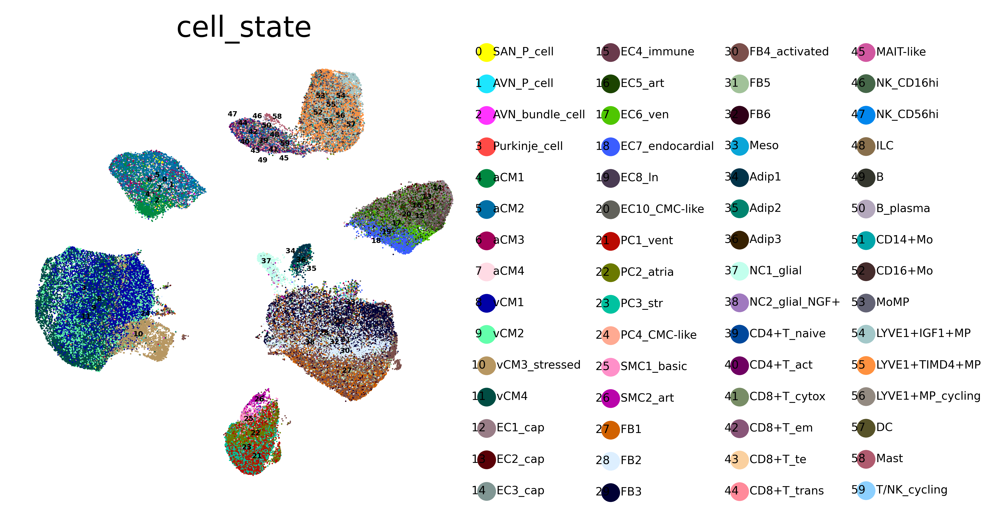

In [31]:
sctk.plot_embedding(adata, groupby='cell_state', basis='umap', color=None, annot=True, frameon=False,legend_fontsize=5,size=2,
                   save='./figures/ATACpeaks_global_cellstate_labeled.pdf')